# Quantitative Spatial Economics 

## Tutorial Topic 7: Vizualize Data using Folium

Humboldt University Berlin & Berlin School of Economics

Authors:
[Dominik Bursy](dominik.bursy@icloud.com), 
[Lars Felder](lars.felder@fu-berlin.de), 
[Kate Bablyak](kateryna.bablyak@student.hu-berlin.de), 
[Marlon Krippendorf](marlon.krippendorf@fu-berlin.de)


Last Update: June 2025

---

- https://python-visualization.github.io/folium/latest/user_guide/vector_layers/polyline.html
- https://sbahn.berlin

## Import Packages <a class="anchor" id="packages"></a>

In [1]:
from pathlib import Path
import os
# Traveltime x Travelcost
import numpy as np
import pandas as pd
import geopandas as gpd
from tabulate import tabulate

import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

import statsmodels.api as sm
from linearmodels import PanelOLS 
# from tabulate import tabulate

import requests, zipfile, io

import warnings
warnings.filterwarnings('ignore')

## Document Options
savefigures = False
# pd.set_option('display.max_columns', None)

In [2]:
## Set Root Directory
ROOT_FOLDER = str(Path().absolute().parent)
print(ROOT_FOLDER)

/Users/dominik.bursy/Documents/8_PhD/2_Second_Year/qse_collaboration


---

## Import Datasets <a class="anchor" id="data_import"></a>

### Load Bezirke Shapefile

In [3]:
bezirke_file = f'{ROOT_FOLDER}/resources/ARSW2015-toolkit-main/shapefile/Bezirke23.shp'
gdf_bezirke = gpd.read_file(bezirke_file).to_crs(3035)

### Load Block Shapefile and Compute Centroids

In [4]:
def load_block_centroids(block_shapefile):
    blocks = gpd.read_file(block_shapefile).to_crs(3035)
    blocks = blocks[blocks.is_valid]
    blocks['centroid'] = blocks.geometry.centroid
    return blocks.set_geometry('centroid'), list(blocks.centroid.apply(lambda p: (p.x, p.y)))

block_file = f'{ROOT_FOLDER}/resources/ARSW2015-toolkit-main/shapefile/Berlin4matlab.shp'

gdf_berlin = gpd.read_file(block_file).to_crs(3035)
gdf_blocks, centroids = load_block_centroids(block_file)

### Load and Combine Transport Network Shapefiles

In [5]:
transport_files = {
    'Streets.shp': 'walk', 
    'UBahn2006_lines.shp': 'ubahn',
    'SBahn2006_lines.shp': 'sbahn',
    'Tram2006_lines.shp': 'tram', 
    'Bus2006_lines.shp': 'bus' 
    }

gdf_transport = []
for path in transport_files:
    gdf = gpd.read_file(f'{ROOT_FOLDER}/data/Shapefiles-2022/Berlin/TransportNetworkParts2006/{path}').to_crs(3035)
    gdf['transport_type'] = transport_files[path]
    gdf_transport.append(gdf)

gdf_transport = gpd.GeoDataFrame(pd.concat(gdf_transport, ignore_index=True))


### Vizualize Network

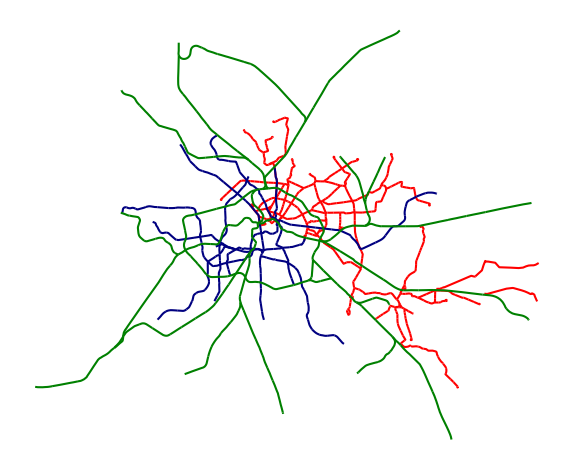

In [6]:
import matplotlib.pyplot as plt
from shapely import Point

fig, axes = plt.subplots()
gdf_transport.loc[gdf_transport['transport_type'] == 'tram'].plot(color='red', ax=axes)
gdf_transport.loc[gdf_transport['transport_type'] == 'ubahn'].plot(color='navy', ax=axes)
gdf_transport.loc[gdf_transport['transport_type'] == 'sbahn'].plot(color='green', ax=axes)
# gdf_Points = gdf_transport.loc[gdf_transport['transport_type'] == 'tram'].get_coordinates().apply(lambda row: Point(row["x"], row["y"]), axis=1)
# gpd.GeoDataFrame(geometry=gdf_Points, crs=3035).plot(color='green', ax=axes)

axes.set_axis_off()
plt.tight_layout()

In [7]:
import folium

# Load shapefile and convert to WGS84 (required by folium)
gdf = gpd.read_file(f'{ROOT_FOLDER}/resources/TTMATRIX-main/Input/UBahn2020_lines_ll.shp').to_crs(epsg=4326)

# [30, 106, 178]  # U-Bahn
# [0, 114, 56]    # S-Bahn
# #%02x%02x%02x' % (30, 106, 178)

# Create map centered on the shapefile's centroid
m = folium.Map(
    location=[gdf_transport.to_crs(epsg=4326).centroid.y.mean(),
              gdf_transport.to_crs(epsg=4326).centroid.x.mean()], 
    zoom_start=10
)

# Add shapefile as GeoJSON
folium.GeoJson(
    gdf_transport.loc[gdf_transport['transport_type'] == 'ubahn'],
    name="Shapefile Layer",
    color="blue",
    tooltip=folium.GeoJsonTooltip(fields=gdf.columns[:3].tolist())  # Show first 3 fields
).add_to(m)

# Add shapefile as GeoJSON
folium.GeoJson(
    gdf_transport.loc[gdf_transport['transport_type'] == 'sbahn'],
    name="Shapefile Layer",
    color="green",
    tooltip=folium.GeoJsonTooltip(fields=gdf.columns[:3].tolist())  # Show first 3 fields
).add_to(m)

# Display map in Jupyter Notebook
m


### Inspect and Select Blocks

Find the 'STAT_BLOCK' of Humboldt-Universität and Berlin Central Train Station

In [11]:
import geopandas as gpd
import folium

# Load shapefile and convert to WGS84 (required by folium)
# gdf = gpd.read_file(f'{ROOT_FOLDER}/resources/ARSW2015-toolkit-main/shapefile/Berlin4matlab.shp').to_crs(epsg=4326)
# gdf = gpd.read_file(f'{ROOT_FOLDER}/data/Shapefiles-2022/Berlin/TransportNetworkParts2006/SBahn2006_lines.shp').to_crs(epsg=4326)
gdf = gdf_berlin[gdf_berlin.is_valid].to_crs(epsg=4326).copy()

# [30, 106, 178]  # U-Bahn
# [0, 114, 56]    # S-Bahn
# #%02x%02x%02x' % (30, 106, 178)

# Create map centered on the shapefile's centroid
m = folium.Map(
    location=[gdf.geometry.centroid.y.mean(), gdf.geometry.centroid.x.mean()],
    zoom_start=10
)

# Add shapefile as GeoJSON
folium.GeoJson(
    gdf,
    name="Shapefile Layer",
    tooltip=folium.GeoJsonTooltip(fields=['STAT_BLOCK'])  # Show first 3 fields
).add_to(m)

# Display map in Jupyter Notebook
m


In [ ]:
import geopandas as gpd
import folium

# Load shapefile and convert to WGS84 (required by folium)
gdf = gdf_berlin[gdf_berlin.is_valid].to_crs(epsg=4326).copy()

# Create map centered on the shapefile's centroid
m = folium.Map(
    location=[gdf.geometry.centroid.y.mean(), gdf.geometry.centroid.x.mean()],
    zoom_start=10
)

#Find the travel time from Humboldt-Universität to (close) Berlin Central Train Station:
condition = (gdf['STAT_BLOCK'] == 102027) | (gdf['STAT_BLOCK'] == 1911)

# Add shapefile as GeoJSON
folium.GeoJson(
    gdf[condition],
    name="Shapefile Layer",
    tooltip=folium.GeoJsonTooltip(fields=['STAT_BLOCK'])  # Show first 3 fields
).add_to(m)

# Display map in Jupyter Notebook
m

oID = mappingPlzToID[102027] #HUB
dID = mappingPlzToID[1911] #BCTS

---

## References <a class="anchor" id="references"></a>

- [GitHub AHS2023-toolkit](#https://github.com/Ahlfeldt/AHS2023-toolkit/tree/main/APPLICATIONS/DATA/OUTPUT)
- [https://github.com/Ahlfeldt/AABPL-toolkit-python?tab=readme-ov-file](#https://github.com/Ahlfeldt/AABPL-toolkit-python?tab=readme-ov-file)
- ...

---